In [1]:
# import os
# import sys
# import sys, os
# sys.path.append(r'C:\Users\Ajind0604\Sentiment Analysis')
# # file_dir = os.path.dirname(r'C:\Users\Ajind0604\Sentiment Analysis')
# sys.path.append(os.path.abspath(r'C:/Users/Ajind0604/Sentiment Analysis')

# # sys.path.append(file_dir)

In [185]:
import os
import sys
# sys.path.append(os.path.join(os.path.dirname('Sentiment_Analysis'), '..'))

file_dir = os.path.dirname('Emotions_Analysis_AWS.ipynb')

sys.path.append(file_dir)

### Creating AWS Session

In [9]:
# os.getcwd()

# %pwd

'C:\\Users\\ajind0604\\Sentiment_Analysis'

In [9]:
import boto3
from pprint import pprint
session = boto3.session.Session(profile_name  = '119215164546/site-developer/ajind0604')
client = session.client('rekognition')

### Fetch Images from URL/Local

In [13]:
import requests

def get_image_from_url(imgurl):
    resp = requests.get(imgurl)
    imgbytes = resp.content
    return imgbytes

def get_image_from_file(filename):
    
    with open(filename, 'rb') as imgfile:
        return imgfile.read()

In [6]:
# from keras.preprocessing import image


def load_photos(directory):
    from os import listdir
    from keras.preprocessing.image import load_img
    from keras.preprocessing.image import img_to_array
    import numpy as np
    images = []
    for name in listdir(directory):
            # load an image from file
            filename = directory + '/' + name # os.path.join(path, image_path)
            image = load_img(filename,grayscale=False) 
#             target_size=(300,200), interpolation='nearest'
#             target_size=(2000, 2000)
            # convert the image pixels to a numpy array
            image = img_to_array(image)
            image = image.astype(np.uint8)
            images.append(image)

    return images
 

In [7]:
def plot_images(images):
    
    import math
    # range(len(images))
    # Just Checking the images by plotting them
    import matplotlib.pyplot as plt
    import math
    fig=plt.figure(figsize=(20,20))
    rows = math.ceil((len(images))/4)
    columns = math.ceil(len(images)/rows)
    for i in range(0, columns*rows ):
        ax = fig.add_subplot(rows, columns, i+1)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        if i < len(images): 
            plt.imshow(images[i])
    plt.tight_layout()
    plt.show()


In [8]:
import pandas as pd
df = pd.DataFrame(columns = ['Image','Confidence','Emotion','Player_Name','No_of_players'])

def detect_emotions(path):
        i = df.shape[0]
        import os
        for image_path in os.listdir(path):
                # create the full input path and read the file
                input_path = os.path.join(path, image_path)
                imgb = get_image_from_file(input_path)
                res = client.detect_faces(
                Image={
                'Bytes': imgb
                },Attributes=['ALL']
                )
                if res['FaceDetails']:
                    d = res['FaceDetails'][0]['Emotions'][0]
                    df.loc[i,'Image'] = image_path
                    df.loc[i,['Emotion','Confidence']] = list(d.values())
                    df.loc[i,'No_of_players'] = len(res['FaceDetails'])
                res1 = client.recognize_celebrities(
                Image={
                    'Bytes': imgb
                        }
                )
                if res1['CelebrityFaces']:
                    if res1['CelebrityFaces'][0]:
                        if res1['CelebrityFaces'][0]['Name']:                          
                            df.loc[i,'Player_Name'] = res1['CelebrityFaces'][0]['Name']
                i = i+1
#             print(list(d.values()))
#             print(input_path)
#             pprint(res['FaceDetails'][0].get('Emotions')[0])


In [80]:
import pandas as pd
df_HS = pd.DataFrame(columns = ['Image','Happy_Confidence','SAD_Confidence','ANGRY_Confidence','Player_Name','No_of_players'])

def detect_emotions_HappySad(path):
        i = df_HS.shape[0]
        import os
        for image_path in os.listdir(path):
                # create the full input path and read the file
                input_path = os.path.join(path, image_path)
                imgb = get_image_from_file(input_path)
                res = client.detect_faces(
                Image={
                'Bytes': imgb
                },Attributes=['ALL']
                )
                if res['FaceDetails']:
                    
                    for j in range(len(res['FaceDetails'][0]['Emotions'])):
                            if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'HAPPY':
                                df_HS.loc[i,'Happy_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 
                            if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'SAD':
                                df_HS.loc[i,'SAD_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 
                            if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'ANGRY':
                                df_HS.loc[i,'ANGRY_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence']
                    

                                
#                     d = res['FaceDetails'][0]['Emotions'][0]
                    df_HS.loc[i,'Image'] = image_path
#                     df.loc[i,['Emotion','Confidence']] = list(d.values())
                    df_HS.loc[i,'No_of_players'] = len(res['FaceDetails'])
                res1 = client.recognize_celebrities(
                Image={
                    'Bytes': imgb
                        }
                )
                if res1['CelebrityFaces']:
                    if res1['CelebrityFaces'][0]:
                        if res1['CelebrityFaces'][0]['Name']:                          
                            df_HS.loc[i,'Player_Name'] = res1['CelebrityFaces'][0]['Name']
                i = i+1
#             print(list(d.values()))
#             print(input_path)
#             pprint(res['FaceDetails'][0].get('Emotions')[0])


In [77]:
directory_AZvsNY

'C:\\Users\\ajind0604\\Downloads\\Sentiment_Analysis\\Arizona_vs_NY'

In [81]:
detect_emotions_HappySad(directory_AZvsNY)

In [82]:
df_HS

,Image,Happy_Confidence,SAD_Confidence,ANGRY_Confidence,Player_Name,No_of_players
0,USATSI_10894514_lowres.jpg,NaN,10.3095,NaN,Jason Vargas,1
1,USATSI_10894515_lowres.jpg,43.0563,NaN,3.48785,Torey Lovullo,1
2,USATSI_10894516_lowres.jpg,25.1784,NaN,14.5395,NaN,1
3,USATSI_10894517_lowres.jpg,NaN,40.5076,NaN,Colin Rea,1
4,USATSI_10894518_lowres.jpg,98.7582,1.10068,NaN,NaN,1
5,USATSI_10894529_lowres.jpg,98.329,1.93015,NaN,NaN,1
7,USATSI_10894549_lowres.jpg,37.4844,NaN,NaN,NaN,6
8,USATSI_10894551_lowres.jpg,NaN,40.7953,NaN,Asdrúbal Cabrera,1
9,USATSI_10894565_lowres.jpg,99.8733,NaN,NaN,NaN,1
10,USATSI_10894566_lowres.jpg,2.29919,NaN,NaN,NaN,1


## Testing

In [67]:
imgb = get_image_from_file(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Arizona_vs_NY/USATSI_10894514_lowres.jpg')

res = client.detect_faces(
                Image={
                'Bytes': imgb
                },Attributes=['ALL']
                )
if res['FaceDetails']:
    for i in range(len(res['FaceDetails'][0]['Emotions'])):
            if res['FaceDetails'][0]['Emotions'][i]['Type'] == 'HAPPY':
                df_HS.loc[i,'Happy_Confidence'] = res['FaceDetails'][0]['Emotions'][i]['Confidence'] 
            if res['FaceDetails'][0]['Emotions'][i]['Type'] == 'SAD':
                df_HS.loc[i,'SAD_Confidence'] = res['FaceDetails'][0]['Emotions'][i]['Confidence'] 
            if res['FaceDetails'][0]['Emotions'][i]['Type'] == 'ANGRY':
                df_HS.loc[i,'ANGRY_Confidence'] = res['FaceDetails'][0]['Emotions'][i]['Confidence']

                                
#                     d = res['FaceDetails'][0]['Emotions'][0]
    df_HS.loc[i,'Image'] = 'USATSI_10894514_lowres.jpg'
#                     df.loc[i,['Emotion','Confidence']] = list(d.values())
    df_HS.loc[i,'No_of_players'] = len(res['FaceDetails'])
res1 = client.recognize_celebrities(
Image={
'Bytes': imgb
    }
)
if res1['CelebrityFaces']:
    if res1['CelebrityFaces'][0]:
        if res1['CelebrityFaces'][0]['Name']:                          
            df_HS.loc[i,'Player_Name'] = res1['CelebrityFaces'][0]['Name']

In [60]:
res

{'FaceDetails': [{'BoundingBox': {'Width': 0.17624999582767487,
    'Height': 0.2611111104488373,
    'Left': 0.4699999988079071,
    'Top': 0.192592591047287},
   'AgeRange': {'Low': 35, 'High': 52},
   'Smile': {'Value': False, 'Confidence': 98.48715209960938},
   'Eyeglasses': {'Value': True, 'Confidence': 99.95375061035156},
   'Sunglasses': {'Value': True, 'Confidence': 63.413177490234375},
   'Gender': {'Value': 'Male', 'Confidence': 99.92733001708984},
   'Beard': {'Value': False, 'Confidence': 99.51268005371094},
   'Mustache': {'Value': False, 'Confidence': 96.14434814453125},
   'EyesOpen': {'Value': True, 'Confidence': 99.67699432373047},
   'MouthOpen': {'Value': False, 'Confidence': 98.47542572021484},
   'Emotions': [{'Type': 'SURPRISED', 'Confidence': 33.728755950927734},
    {'Type': 'SAD', 'Confidence': 10.309523582458496},
    {'Type': 'CONFUSED', 'Confidence': 8.781856536865234}],
   'Landmarks': [{'Type': 'eyeLeft',
     'X': 0.5229153633117676,
     'Y': 0.28363722

In [9]:
def detect_player(path):
        i = df.shape[0]
        import os
        for image_path in os.listdir(path):
                # create the full input path and read the file
                input_path = os.path.join(path, image_path)
                imgb = get_image_from_file(input_path)
                res = client.recognize_celebrities(
                Image={
                'Bytes': imgb
                }
                )
                res1 = client.recognize_celebrities(
                Image={
                    'Bytes': imgb
                        }
                )
                if res1['CelebrityFaces'][0]['Name']:
                    df.loc[i,'Player_Name'] = res1['CelebrityFaces'][0]['Name']
                    i = i+1

In [10]:
from os import listdir
listdir(r'C:\Users\ajind0604\Downloads\Sentiment_Analysis\Arizona_vs_NY')

['USATSI_10894514_lowres.jpg',
 'USATSI_10894515_lowres.jpg',
 'USATSI_10894516_lowres.jpg',
 'USATSI_10894517_lowres.jpg',
 'USATSI_10894518_lowres.jpg',
 'USATSI_10894529_lowres.jpg',
 'USATSI_10894530_lowres.jpg',
 'USATSI_10894549_lowres.jpg',
 'USATSI_10894551_lowres.jpg',
 'USATSI_10894565_lowres.jpg',
 'USATSI_10894566_lowres.jpg',
 'USATSI_10894567_lowres.jpg',
 'USATSI_10894628_lowres.jpg',
 'USATSI_10894629_lowres.jpg',
 'USATSI_10894630_lowres.jpg',
 'USATSI_10894631_lowres.jpg',
 'USATSI_10894633_lowres.jpg',
 'USATSI_10894634_lowres.jpg',
 'USATSI_10894635_lowres.jpg',
 'USATSI_10894636_lowres.jpg',
 'USATSI_10894637_lowres.jpg',
 'USATSI_10894638_lowres.jpg']

In [11]:
# if res['CelebrityFaces'][0]['Urls']:
#     print('abc')

In [87]:
imgb = get_image_from_file(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Arizona_vs_NY/USATSI_10894631_lowres.jpg')
res1 = client.recognize_celebrities(
Image={
'Bytes': imgb
    }
)
# res = client.detect_faces(
# Image={
# 'Bytes': imgb
# },Attributes=['ALL']
# )

In [88]:
res1

{'CelebrityFaces': [{'Urls': [],
   'Name': 'Hiroshi Iwata',
   'Id': '3xM2eZ',
   'Face': {'BoundingBox': {'Width': 0.1191028580069542,
     'Height': 0.09624999761581421,
     'Left': 0.4988399147987366,
     'Top': 0.11874999850988388},
    'Confidence': 99.99983215332031,
    'Landmarks': [{'Type': 'eyeLeft',
      'X': 0.5409561395645142,
      'Y': 0.1493990570306778},
     {'Type': 'eyeRight', 'X': 0.5758466720581055, 'Y': 0.14959770441055298},
     {'Type': 'nose', 'X': 0.539538562297821, 'Y': 0.1673010289669037},
     {'Type': 'mouthLeft', 'X': 0.5351864695549011, 'Y': 0.19154119491577148},
     {'Type': 'mouthRight', 'X': 0.5625105500221252, 'Y': 0.1928049623966217}],
    'Pose': {'Roll': 1.67026948928833,
     'Yaw': -21.44457244873047,
     'Pitch': 3.8967132568359375},
    'Quality': {'Brightness': 35.08598327636719,
     'Sharpness': 99.9945297241211}},
   'MatchConfidence': 64.0}],
 'UnrecognizedFaces': [],
 'OrientationCorrection': 'ROTATE_0',
 'ResponseMetadata': {'Req

In [ ]:
response = client.get_celebrity_info(
    Id='string'
)

In [42]:
len(res['FaceDetails'])

1

In [55]:
res['FaceDetails'][0]['Emotions'][0]['Confidence']

33.728755950927734

In [53]:
range(len(res['FaceDetails'][0]['Emotions']))

range(0, 3)

In [51]:
for i in range(len(res['FaceDetails'][0]['Emotions'])):
    if res['FaceDetails'][0]['Emotions'][i]['Type'] == 'HAPPY':
        
        
    
    

[{'Type': 'SURPRISED', 'Confidence': 33.728755950927734},
 {'Type': 'SAD', 'Confidence': 10.309523582458496},
 {'Type': 'CONFUSED', 'Confidence': 8.781856536865234}]

## Arizona Vs NY (18th June)

In [12]:
# load images
directory_AZvsNY = r'C:\Users\ajind0604\Downloads\Sentiment_Analysis\Arizona_vs_NY'
images_AZvsNY = load_photos(directory_AZvsNY)

C:\Users\ajind0604\AppData\Local\Continuum\anaconda2\envs\py36\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [13]:
print('Loaded Images: %d' % len(images_AZvsNY))

Loaded Images: 22


In [14]:
plot_images(images_AZvsNY)

<Figure size 2000x2000 with 24 Axes>

In [15]:
detect_emotions(directory_AZvsNY)

In [18]:
df

,Image,Confidence,Emotion,Player_Name,No_of_players
0,USATSI_10894514_lowres.jpg,33.7288,SURPRISED,Jason Vargas,1
1,USATSI_10894515_lowres.jpg,43.0563,HAPPY,Torey Lovullo,1
2,USATSI_10894516_lowres.jpg,25.1784,HAPPY,NaN,1
3,USATSI_10894517_lowres.jpg,40.5076,SAD,Colin Rea,1
4,USATSI_10894518_lowres.jpg,98.7582,HAPPY,NaN,1
5,USATSI_10894529_lowres.jpg,98.329,HAPPY,NaN,1
7,USATSI_10894549_lowres.jpg,37.4844,HAPPY,NaN,6
8,USATSI_10894551_lowres.jpg,43.8445,CONFUSED,Asdrúbal Cabrera,1
9,USATSI_10894565_lowres.jpg,99.8733,HAPPY,NaN,1
10,USATSI_10894566_lowres.jpg,55.2299,CONFUSED,NaN,1


## Chicago Vs Cleveland Indians

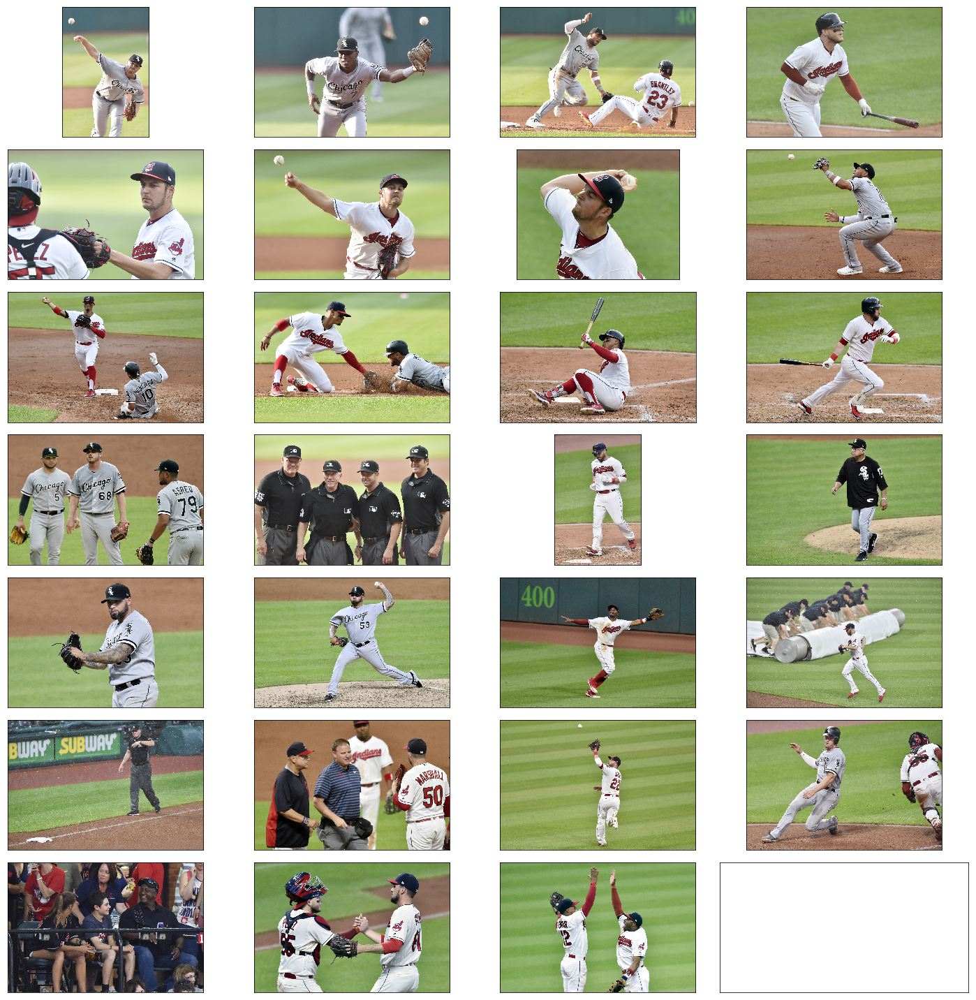

In [20]:
directory_CHvsCI = r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Chicago_vs_Cleveland/'
images_CHvsCI = load_photos(directory_CHvsCI)
plot_images(images_CHvsCI)

In [21]:
detect_emotions(directory_CHvsCI)

In [22]:
df

,Image,Confidence,Emotion,Player_Name,No_of_players
0,USATSI_10894514_lowres.jpg,33.7288,SURPRISED,Jason Vargas,1
1,USATSI_10894515_lowres.jpg,43.0563,HAPPY,Torey Lovullo,1
2,USATSI_10894516_lowres.jpg,25.1784,HAPPY,NaN,1
3,USATSI_10894517_lowres.jpg,40.5076,SAD,Colin Rea,1
4,USATSI_10894518_lowres.jpg,98.7582,HAPPY,NaN,1
5,USATSI_10894529_lowres.jpg,98.329,HAPPY,NaN,1
7,USATSI_10894549_lowres.jpg,37.4844,HAPPY,NaN,6
8,USATSI_10894551_lowres.jpg,43.8445,CONFUSED,Asdrúbal Cabrera,1
9,USATSI_10894565_lowres.jpg,99.8733,HAPPY,NaN,1
10,USATSI_10894566_lowres.jpg,55.2299,CONFUSED,NaN,1


### Bays vs Astros

In [23]:
directory_BaysvsAstros = r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Bay_Vs_Astros_lowres/'
images_BaysvsAstros = load_photos(directory_BaysvsAstros)

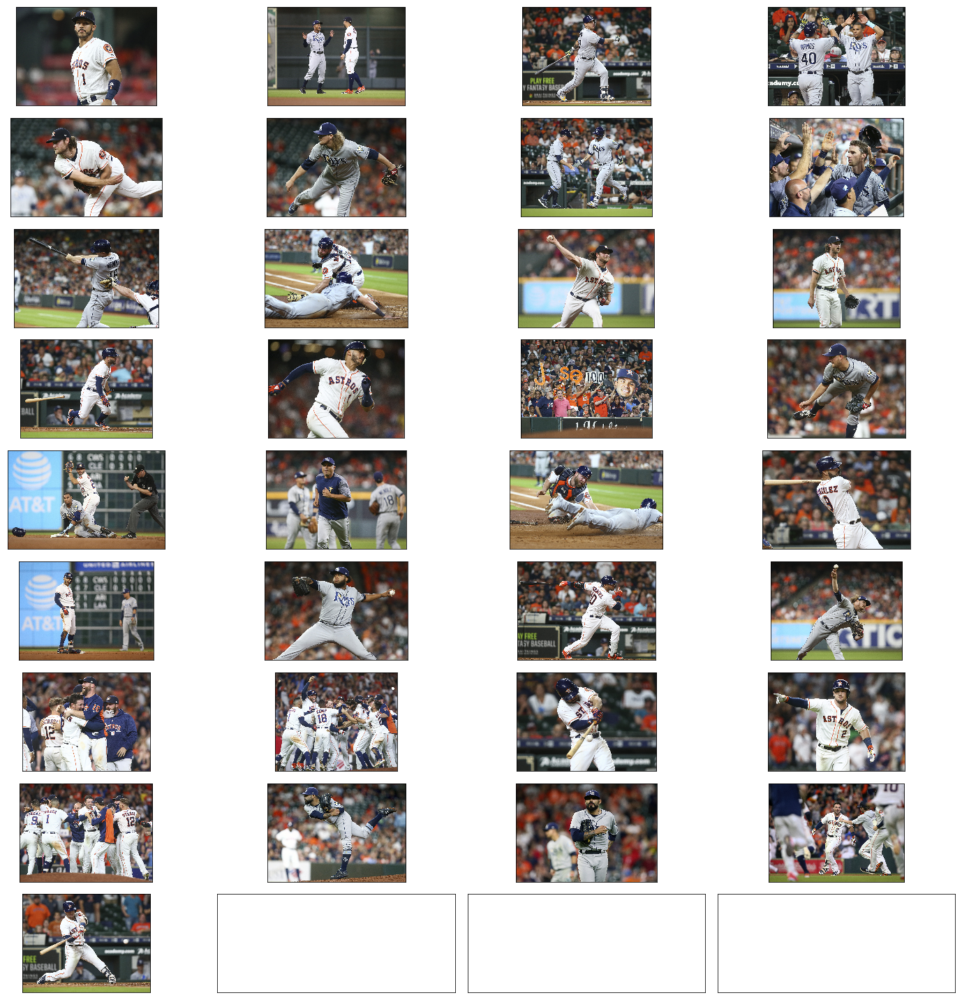

In [24]:
plot_images(images_BaysvsAstros)

In [25]:
detect_emotions(directory_BaysvsAstros)

In [26]:
# import matplotlib.pyplot as plt
# fig=plt.figure(figsize=(40,40))

# plt.imshow(get_image_from_file(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/))

### Marlins vs Giants

In [27]:
directory_MarvsGiants = r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Marlins_vs_Giants_lowres/'
images_MarvsGiants = load_photos(directory_MarvsGiants)

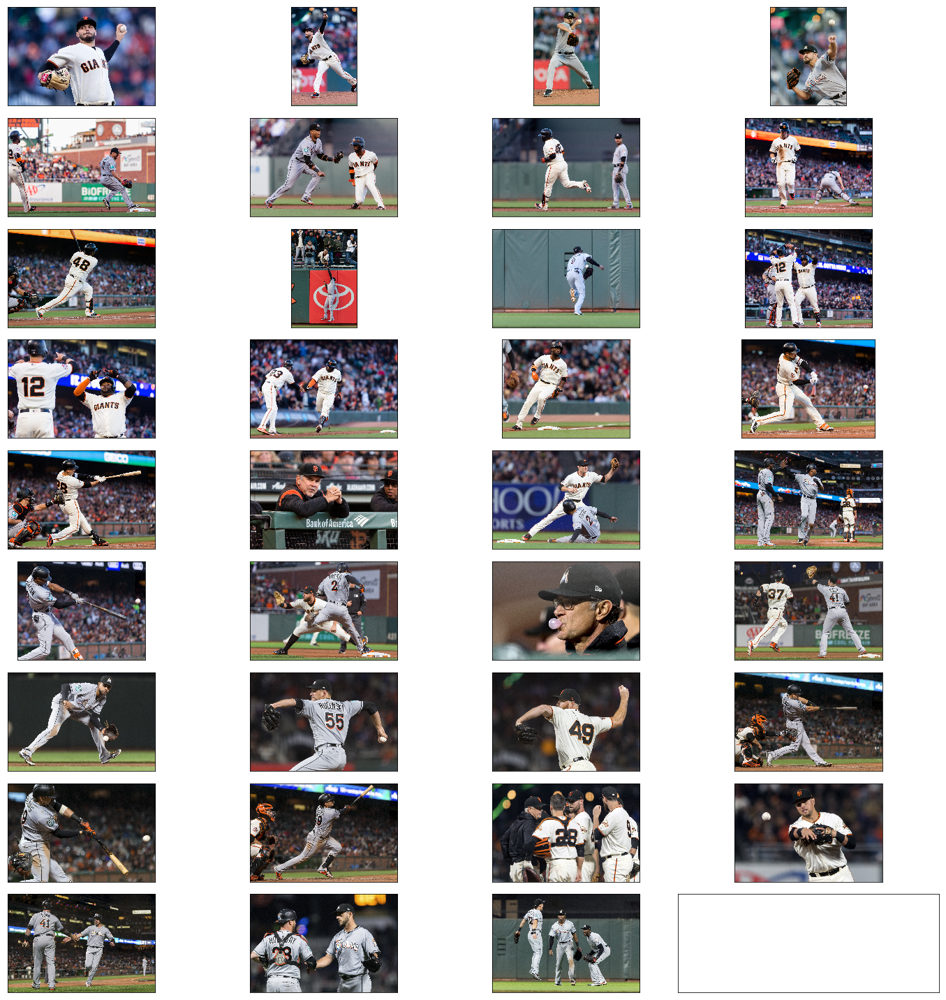

In [28]:
plot_images(images_MarvsGiants)

In [29]:
detect_emotions(directory_BaysvsAstros)

In [30]:
df.sort_values(by = 'Confidence',ascending=False)

,Image,Confidence,Emotion,Player_Name,No_of_players
9,USATSI_10894565_lowres.jpg,99.8733,HAPPY,NaN,1
66,USATSI_10899395_lowres.jpg,99.7863,SURPRISED,NaN,1
48,USATSI_10899395_lowres.jpg,99.7863,SURPRISED,NaN,1
69,USATSI_10899519_lowres.jpg,99.0829,HAPPY,José Altuve,72
51,USATSI_10899519_lowres.jpg,99.0829,HAPPY,José Altuve,72
4,USATSI_10894518_lowres.jpg,98.7582,HAPPY,NaN,1
5,USATSI_10894529_lowres.jpg,98.329,HAPPY,NaN,1
33,USATSI_10899309_lowres.jpg,96.5608,HAPPY,Wade LeBlanc,4
80,USATSI_10899730_lowres.jpg,96.3793,HAPPY,Jesse Biddle,3
47,USATSI_10899394_lowres.jpg,95.4151,HAPPY,Gerrit Cole,1


In [31]:
df.to_csv("sentiments_MLB.csv")

## Yankees

In [76]:
def detect_emotions_team(path,teamName,won,df_HS):
        i = df_HS.shape[0]
        import os
        for image_path in os.listdir(path):
                # create the full input path and read the file
                input_path = os.path.join(path, image_path)
                imgb = get_image_from_file(input_path)
                res = client.detect_faces(
                Image={
                'Bytes': imgb
                },Attributes=['ALL']
                )
                if res['FaceDetails']:
                    
                    
                    for j in range(len(res['FaceDetails'][0]['Emotions'])):
#                             if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'HAPPY':
                        if (j == 0):
        
                            df_HS.loc[i,'Top_Emotion'] = res['FaceDetails'][0]['Emotions'][j]['Type'] 
                            df_HS.loc[i,'Top_Emotion_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 
                        if (j == 1):

#                             if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'SAD':
                            df_HS.loc[i,'Second_Emotion'] = res['FaceDetails'][0]['Emotions'][j]['Type'] 
                            df_HS.loc[i,'Second_Emotion_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 
                        if (j == 2):

#                             if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'ANGRY':
                            df_HS.loc[i,'Third_Emotion'] = res['FaceDetails'][0]['Emotions'][j]['Type']
                            df_HS.loc[i,'Third_Emotion_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 

                    

                                
#                     d = res['FaceDetails'][0]['Emotions'][0]
                    df_HS.loc[i,'Image'] = image_path
                    df_HS.loc[i,'Team_Name'] = teamName

#                     df.loc[i,['Emotion','Confidence']] = list(d.values())
                    df_HS.loc[i,'No_of_players'] = len(res['FaceDetails'])
                if (won in "Won"):
                    df_HS.loc[i,'Won'] = 'Y'
                else:
                    df_HS.loc[i,'Won'] = 'N'


                    
                res1 = client.recognize_celebrities(
                Image={
                    'Bytes': imgb
                        }
                )
                if res1['CelebrityFaces']:
                    if res1['CelebrityFaces'][0]:
                        if res1['CelebrityFaces'][0]['Name']:                          
                            df_HS.loc[i,'Player_Name'] = res1['CelebrityFaces'][0]['Name']
                i = i+1
#             print(list(d.values()))
#             print(input_path)
#             pprint(res['FaceDetails'][0].get('Emotions')[0])
import pandas as pd
df_Yankees = pd.DataFrame(columns = ['Image','Top_Emotion','Second_Emotion','Third_Emotion','Player_Name','No_of_players'])
detect_emotions_team(r'C:/Users/ajind0604/Pictures/Yankees/Yankess_won/',"Yankees","Won",df_Yankees)

detect_emotions_team(r'C:/Users/ajind0604/Pictures/Yankees/Yankees_lost/',"Yankees","Lost",df_Yankees)

In [100]:
df_Yankees = df_Yankees[df_Yankees['Top_Emotion_Confidence'] > 70.0]

In [101]:
df_Yankees.to_csv("Yankees.csv")

In [102]:
df_Yankees[df_Yankees['Top_Emotion_Confidence'] > 70.0].groupby(by = ['Won','Top_Emotion']).mean()['Top_Emotion_Confidence']

Won  Top_Emotion
N    ANGRY          73.979904
     HAPPY          87.151828
Y    HAPPY          89.416249
     SURPRISED      76.573616
Name: Top_Emotion_Confidence, dtype: float64

## Happy

In [117]:
df_Yankees[(df_Yankees['Top_Emotion'] == 'HAPPY') & (df_Yankees['Won'] == 'Y')].sort_values(by = ['Top_Emotion_Confidence'],ascending = False)

,Image,Top_Emotion,Second_Emotion,Third_Emotion,Player_Name,No_of_players,Top_Emotion_Confidence,Second_Emotion_Confidence,Third_Emotion_Confidence,Team_Name,Won
1,USATSI_10894490_lowres.jpg,HAPPY,CONFUSED,SURPRISED,NaN,1.0,99.543938,1.793689,0.511664,Yankees,Y
47,USATSI_10910010_lowres.jpg,HAPPY,ANGRY,SAD,Aaron Judge,1.0,99.375710,1.926237,1.000577,Yankees,Y
30,USATSI_10909402_lowres.jpg,HAPPY,SURPRISED,SAD,Aaron Judge,1.0,98.214508,15.377873,0.560004,Yankees,Y
12,USATSI_10895747_lowres.jpg,HAPPY,SAD,CALM,NaN,2.0,97.794205,41.815292,6.818146,Yankees,Y
2,USATSI_10894492_lowres.jpg,HAPPY,SAD,ANGRY,José Altuve,1.0,97.461166,5.679184,1.249510,Yankees,Y
9,USATSI_10895687_lowres.jpg,HAPPY,SURPRISED,ANGRY,NaN,1.0,95.719070,1.084471,1.016605,Yankees,Y
27,USATSI_10909243_lowres.jpg,HAPPY,SAD,SURPRISED,Aaron Judge,2.0,93.186958,8.514184,3.436059,Yankees,Y
14,USATSI_10899744_lowres.jpg,HAPPY,SURPRISED,SAD,Aaron Judge,1.0,92.424774,33.410805,0.527442,Yankees,Y
16,USATSI_10900718_lowres.jpg,HAPPY,CALM,ANGRY,Lamine Sané,1.0,90.096321,35.364117,1.011550,Yankees,Y
33,USATSI_10909405_lowres.jpg,HAPPY,SAD,DISGUSTED,Aaron Judge,1.0,86.885460,8.453279,1.496881,Yankees,Y


## Angry

In [118]:
df_Yankees[(df_Yankees['Top_Emotion'] == 'SURPRISED') & (df_Yankees['Won'] == 'Y')].sort_values(by = ['Top_Emotion_Confidence'],ascending = False)

,Image,Top_Emotion,Second_Emotion,Third_Emotion,Player_Name,No_of_players,Top_Emotion_Confidence,Second_Emotion_Confidence,Third_Emotion_Confidence,Team_Name,Won
18,USATSI_10903612_lowres.jpg,SURPRISED,ANGRY,HAPPY,NaN,1.0,76.573616,35.957558,17.560335,Yankees,Y


In [82]:
imgb = get_image_from_file(r'C:\Users\ajind0604\Pictures\Yankees\Yankess_won\USATSI_10903740_lowres.jpg')
res = client.detect_faces(
Image={
'Bytes': imgb
},Attributes=['ALL']
)

In [111]:
df_Yankees.shape

(26, 11)

In [104]:
df_RedSox = pd.DataFrame(columns = ['Image','Top_Emotion','Second_Emotion','Third_Emotion','Player_Name','No_of_players'])
detect_emotions_team(r'C:/Users/ajind0604/Pictures/Boston/Won/',"RedSox","Won",df_RedSox)

detect_emotions_team(r'C:/Users/ajind0604/Pictures/Boston/Lost/',"RedSox","Lost",df_RedSox)

In [108]:
df_RedSox[df_RedSox['Top_Emotion_Confidence'] > 60.0]

,Image,Top_Emotion,Second_Emotion,Third_Emotion,Player_Name,No_of_players,Top_Emotion_Confidence,Second_Emotion_Confidence,Third_Emotion_Confidence,Team_Name,Won
1,USATSI_10894510_lowres.jpg,HAPPY,CALM,SAD,NaN,1.0,65.199730,5.724830,3.350651,RedSox,Y
2,USATSI_10894554_lowres.jpg,HAPPY,SAD,ANGRY,NaN,1.0,61.933296,8.511650,4.376417,RedSox,Y
5,USATSI_10897156_lowres.jpg,HAPPY,SAD,SURPRISED,NaN,1.0,77.397400,2.027476,1.772600,RedSox,Y
6,USATSI_10897209_lowres.jpg,HAPPY,SAD,ANGRY,NaN,1.0,85.702393,64.075249,0.812143,RedSox,Y
7,USATSI_10897252_lowres.jpg,SURPRISED,HAPPY,SAD,NaN,1.0,99.251526,65.157326,3.813964,RedSox,Y
9,USATSI_10901308_lowres.jpg,SURPRISED,HAPPY,SAD,José Berríos,1.0,93.409325,37.002739,1.014167,RedSox,Y
10,USATSI_10901445_lowres.jpg,HAPPY,SURPRISED,SAD,NaN,1.0,64.508492,12.577545,4.649687,RedSox,Y
11,USATSI_10901483_lowres.jpg,SURPRISED,SAD,HAPPY,NaN,1.0,98.874695,4.962504,3.461993,RedSox,Y
13,USATSI_10903666_lowres.jpg,HAPPY,SAD,CALM,Rick Porcello,1.0,98.577705,0.648290,0.379735,RedSox,Y
14,USATSI_10903711_lowres.jpg,HAPPY,CONFUSED,SAD,NaN,2.0,95.138397,6.592250,3.399003,RedSox,Y


In [106]:
df_RedSox[df_RedSox['Top_Emotion_Confidence'] > 70.0].groupby(by = ['Won','Top_Emotion']).mean()['Top_Emotion_Confidence']

Won  Top_Emotion
N    HAPPY          95.892342
Y    CALM           93.337616
     HAPPY          91.516674
     SURPRISED      97.178515
Name: Top_Emotion_Confidence, dtype: float64

In [109]:
df_RedSox = df_RedSox[df_RedSox['Top_Emotion_Confidence'] > 70.0]

In [110]:
df_Yankees.to_csv("RedSox.csv")

In [ ]:
detect_emotions_team(r'C:/Users/ajind0604/Pictures/Yankees/Yankess_won/',"Yankees","Won",df_Yankees)


## Emotions in a Match

In [52]:
# def detect_emotions_match(path,matchinfo,WinnerImage,Winner,Loser,df_HS):
#         i = df_HS.shape[0]
#         import os
#         for image_path in os.listdir(path):
#                 # create the full input path and read the file
#                 input_path = os.path.join(path, image_path)
#                 imgb = get_image_from_file(input_path)
#                 res = client.detect_faces(
#                 Image={
#                 'Bytes': imgb
#                 },Attributes=['ALL']
#                 )
#                 if res['FaceDetails']:
                    
                    
#                     for j in range(len(res['FaceDetails'][0]['Emotions'])):
# #                             if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'HAPPY':
#                         if (j == 0):
        
#                             df_HS.loc[i,'Top_Emotion'] = res['FaceDetails'][0]['Emotions'][j]['Type'] 
#                             df_HS.loc[i,'Top_Emotion_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 
# #                         if (j == 1):

# # #                             if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'SAD':
# #                             df_HS.loc[i,'Second_Emotion'] = res['FaceDetails'][0]['Emotions'][j]['Type'] 
# #                             df_HS.loc[i,'Second_Emotion_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 
# #                         if (j == 2):

# # #                             if res['FaceDetails'][0]['Emotions'][j]['Type'] == 'ANGRY':
# #                             df_HS.loc[i,'Third_Emotion'] = res['FaceDetails'][0]['Emotions'][j]['Type']
# #                             df_HS.loc[i,'Third_Emotion_Confidence'] = res['FaceDetails'][0]['Emotions'][j]['Confidence'] 

                    

                                
# #                     d = res['FaceDetails'][0]['Emotions'][0]
#                     df_HS.loc[i,'Image'] = image_path
#                     df_HS.loc[i,'Game_Info'] = matchinfo
# #                     df_HS.loc[i,'Winner'] = Winner
# #                     df_HS.loc[i,'Loser'] = Loser

                
# #                     df.loc[i,['Emotion','Confidence']] = list(d.values())
#                     df_HS.loc[i,'No_of_players'] = len(res['FaceDetails'])
#                 if (WinnerImage in "WinnerImage"):
#                     df_HS.loc[i,'Image_Team'] = Winner
#                     df_HS.loc[i,'Is_Winner'] = 'Y'

#                 else:
#                     df_HS.loc[i,'Image_Team'] = Loser
#                     df_HS.loc[i,'Is_Winner'] = 'N'



                    
#                 res1 = client.recognize_celebrities(
#                 Image={
#                     'Bytes': imgb
#                         }
#                 )
#                 if res1['CelebrityFaces']:
#                     if res1['CelebrityFaces'][0]:
#                         if res1['CelebrityFaces'][0]['Name']:                          
#                             df_HS.loc[i,'Player_Name'] = res1['CelebrityFaces'][0]['Name']
#                 i = i+1
# #             print(list(d.values()))
# #             print(input_path)
# #             pprint(res['FaceDetails'][0].get('Emotions')[0])

In [125]:
df_ARZvsMets[df_ARZvsMets.Is_Winner == 'N']["Image_Team"].iloc[0]

'Arizona'

## Plot Emotions

In [53]:
# def plot_emotions(df_game):
#         import seaborn as sns
#         import matplotlib.pyplot as plt
#         sns.set_style("whitegrid")
#         df_game = df_game[df_game['Top_Emotion_Confidence'] > 70.0]
#         fig, ax = plt.subplots(figsize = (8,6))
#         ax = sns.barplot(x="Image_Team", y="Top_Emotion_Confidence",hue="Top_Emotion",data=pd.DataFrame((df_game.groupby(['Image_Team','Top_Emotion']).mean()).to_records())).set_title(df_game[df_game.Is_Winner == 'Y']["Image_Team"].iloc[0]+" Beat "+ df_game[df_game.Is_Winner == 'N']["Image_Team"].iloc[0], fontdict = {'fontsize': 16});
#         ax.set_fontstyle("italic")
#         plt.xlabel("Team Name")
#         plt.ylabel("Emotion Confidence (%)")        
#         plt.show()       
# # sns.countplot(palette = 'gist_ncar',x= 'YEAR',hue = 'EMPLOYER_NAME',data = subset)

Text(0,0.5,'Emotion Confidence (%)')

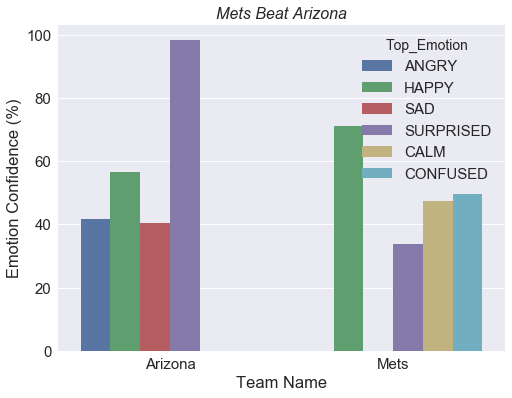

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt


## Arizona Vs Mets

In [14]:
df_ARZvsMets = pd.DataFrame(columns = ['Game_Info','Image','Image_Team','Top_Emotion','Player_Name','No_of_players'])
detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Arizona_vs_NY/Winner/',"Arizona_vs_NYMets","WinnerImage","Mets","Arizona",df_ARZvsMets)

detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Arizona_vs_NY/Loser/',"Arizona_vs_NYMets","Loser","Mets","Arizona",df_ARZvsMets)

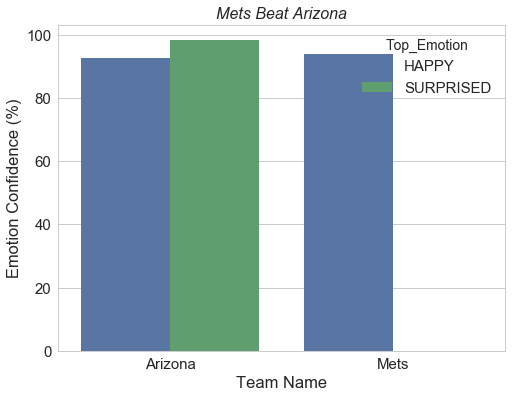

In [47]:
plot_emotions(df_ARZvsMets)

## Bays Vs Astros

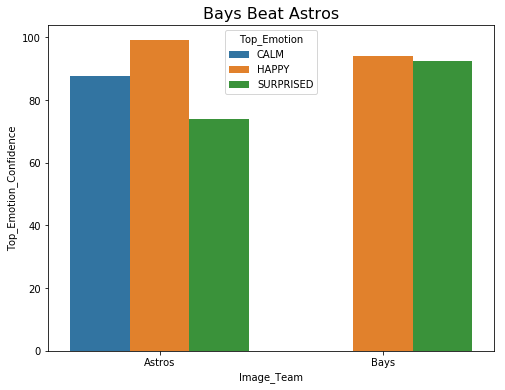

In [128]:
df_BaysVsAstros = pd.DataFrame(columns = ['Game_Info','Image','Image_Team','Top_Emotion','Player_Name','No_of_players'])
detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Bay_Vs_Astros_lowres/Winner/',"Bay_Vs_Astros","WinnerImage","Bays","Astros",df_BaysVsAstros)

detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Bay_Vs_Astros_lowres/Loser/',"Bay_Vs_Astros","Loser","Bays","Astros",df_BaysVsAstros)


plot_emotions(df_BaysVsAstros)

## Chicago Vs Cleveland Indians

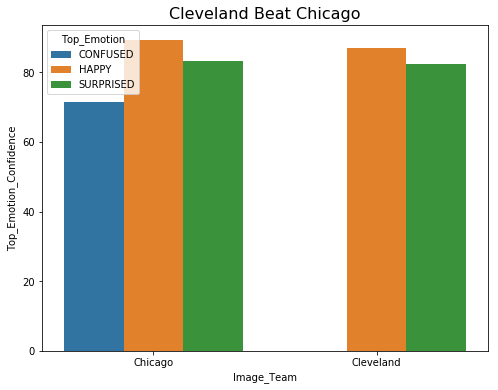

In [129]:
df_Chicago_vs_Cleveland = pd.DataFrame(columns = ['Game_Info','Image','Image_Team','Top_Emotion','Player_Name','No_of_players'])
detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Chicago_vs_Cleveland/Winner/',"Chicago_vs_Cleveland","WinnerImage","Cleveland","Chicago",df_Chicago_vs_Cleveland)

detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Chicago_vs_Cleveland/Loser/',"Chicago_vs_Cleveland","Loser","Cleveland","Chicago",df_Chicago_vs_Cleveland)


plot_emotions(df_Chicago_vs_Cleveland)

In [163]:
def get_best_3Images(df_Chicago_vs_Cleveland,directory):
    top_3_images = df_Chicago_vs_Cleveland[df_Chicago_vs_Cleveland['Top_Emotion_Confidence'] > 70.0].sort_values(by = 'Top_Emotion_Confidence',ascending = False).iloc[0:3,1]
    
    from keras.preprocessing.image import load_img
    from keras.preprocessing.image import img_to_array
    import numpy as np
    images = []
    for image_name in top_3_images.tolist():
            # load an image from file
            
            filename = directory + '/' + image_name # os.path.join(path, image_path)
            image = load_img(filename,grayscale=False) 
#             target_size=(300,200), interpolation='nearest'
#             target_size=(2000, 2000)
            # convert the image pixels to a numpy array
            image = img_to_array(image)
            image = image.astype(np.uint8)
            images.append(image)
    import matplotlib.pyplot as plt
    fig, ((ax1, ax2,ax3)) = plt.subplots(3, 1,figsize = (20,15))
    ax1.xaxis.set_visible(False)
    ax1.yaxis.set_visible(False)
    ax2.xaxis.set_visible(False)
    ax2.yaxis.set_visible(False)
    ax3.xaxis.set_visible(False)
    ax3.yaxis.set_visible(False)
    ax1.imshow(images[0])
    ax2.imshow(images[1])
    ax3.imshow(images[2])
    plt.tight_layout()
    plt.show()

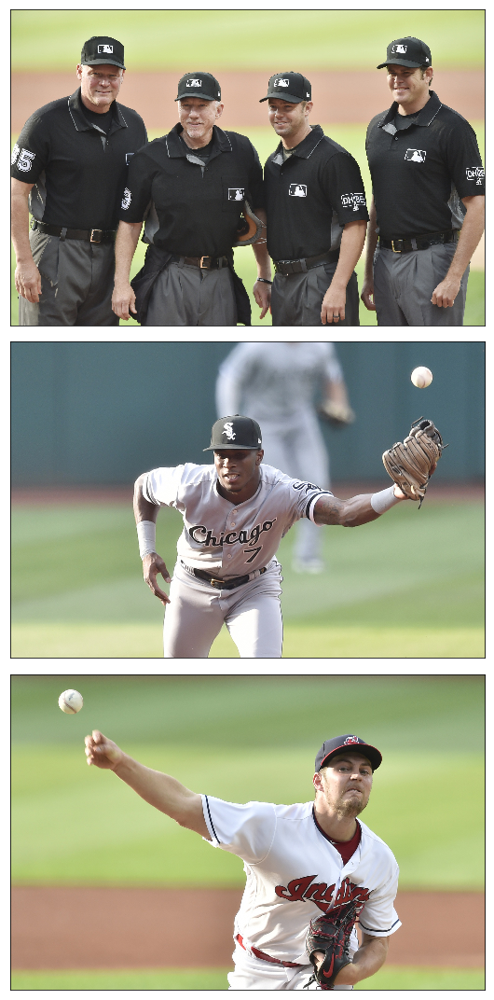

In [164]:
get_best_3Images(df_Chicago_vs_Cleveland,r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Chicago_vs_Cleveland')

## Toronto Vs Astros

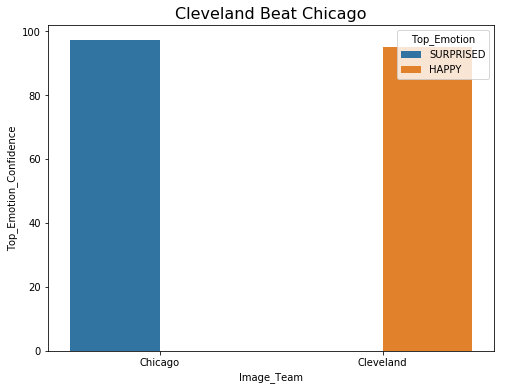

In [171]:
df_Toronto_vs_Astros = pd.DataFrame(columns = ['Game_Info','Image','Image_Team','Top_Emotion','Player_Name','No_of_players'])
detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Toronto_vs_Astros/Winner/',"Toronto_vs_Astros","WinnerImage","Astros","Toronto",df_Toronto_vs_Astros)

detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Toronto_vs_Astros/Loser/',"Toronto_vs_Astros","Loser","Astros","Toronto",df_Toronto_vs_Astros)

plot_emotions(df_Toronto_vs_Astros)

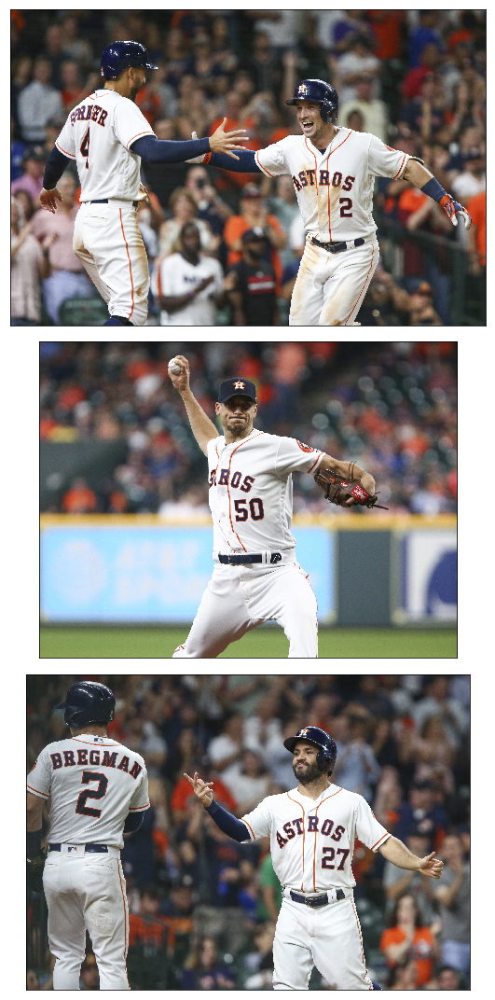

In [172]:
get_best_3Images(df_Toronto_vs_Astros,r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Toronto_vs_Astros')

## Bay Vs Astros

In [1]:
import pandas as pd
from VSCode.emotions import detect_emotions_match,plot_emotions
df_BaysVsAstros = pd.DataFrame(columns = ['Game_Info','Image','Image_Team','Top_Emotion','Player_Name','No_of_players'])
detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Bay_Vs_Astros_lowres/Winner/',"Bay_Vs_Astros","WinnerImage","Bays","Astros",df_BaysVsAstros)
detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Bay_Vs_Astros_lowres/Loser/',"Bay_Vs_Astros","Loser","Bays","Astros",df_BaysVsAstros)

In [35]:
def reload_package():
    import importlib
    import VSCode
    importlib.reload(VSCode.emotions)


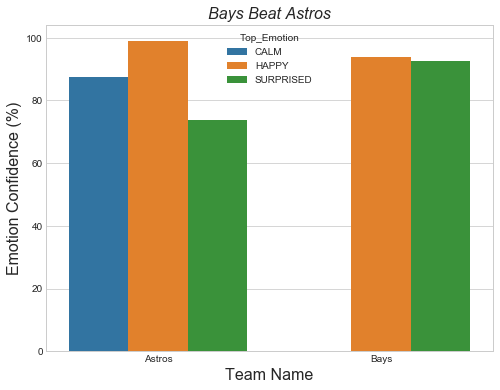

In [20]:
plot_emotions(df_BaysVsAstros)

## Toronto Vs Astros

In [30]:
reload_package()

In [26]:
df_Toronto_vs_Astros = pd.DataFrame(columns = ['Game_Info','Image','Image_Team','Top_Emotion','Player_Name','No_of_players'])
detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Toronto_vs_Astros/Winner/',"Toronto_vs_Astros","WinnerImage","Astros","Toronto",df_Toronto_vs_Astros)

detect_emotions_match(r'C:/Users/ajind0604/Downloads/Sentiment_Analysis/Toronto_vs_Astros/Loser/',"Toronto_vs_Astros","Loser","Astros","Toronto",df_Toronto_vs_Astros)

In [32]:
import importlib
import VSCode
importlib.reload(VSCode.emotions)

<module 'VSCode.emotions' from 'C:\\Users\\ajind0604\\Sentiment_Analysis\\VSCode\\emotions.py'>

In [33]:
from VSCode.emotions import detect_emotions_match,plot_emotions

Reflecting


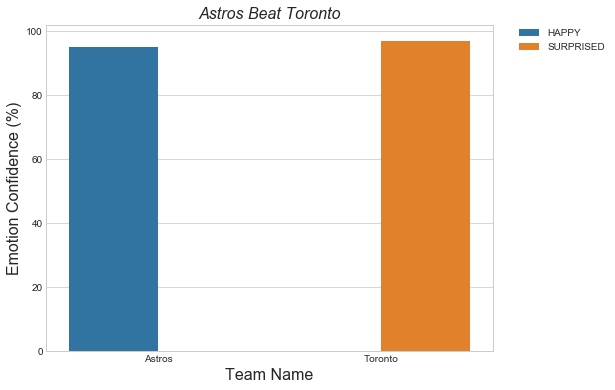

In [36]:
plot_emotions(df_Toronto_vs_Astros)

### Fetch Data from MYSQL DB

In [2]:
import pymysql.cursors
sqlQuery = "SELECT ImageURL,playerId FROM rekognitionschema.cbs_player_image;"
# Connect to the database
connection = pymysql.connect(
    host='localhost',
    user='root',
    password='837906',
    charset='utf8mb4',
    db='rekognitionschema',
    cursorclass=pymysql.cursors.DictCursor)

cursorObject = connection.cursor()
cursorObject.execute(sqlQuery)
#Fetch all the rows
rows = cursorObject.fetchall()
for row in rows:

    print(row["ImageURL"])

    print(str(row["playerId"]))

https://b.fssta.com/uploads/application/mlb/players/7913.vresize.350.425.medium.41.png
7525
http://metsmerizedonline.com/wp-content/uploads/2016/03/bartolo-colon-2.png
7525
https://pbs.twimg.com/media/CSYLy-iUsAErKQn.png
7525
https://usatthebiglead.files.wordpress.com/2016/12/bartolo-colon-workout.png?w=1000&h=600&crop=1
7525
https://cdn.vox-cdn.com/thumbor/dFnFu6CelTQe7_GS_rr3Jtld1yM=/0x0:842x474/1600x900/cdn.vox-cdn.com/uploads/chorus_image/image/50107001/bartolo_colon_home_run_derby_champ.0.0.png
7525
https://www.whatproswear.com/wp-content/uploads/2016/09/Adrian-Beltre-Bat-Glove-CLeats.png
11491
https://files.shandymedia.com/wp-content/uploads/2017/05/14144701/adrian-beltre-one-knee-home-run.png
11491
https://cdn-s3.si.com/s3fs-public/styles/marquee_large_2x/public/2017/07/31/felix-hernandez-adrian-beltre-hug-video.png?itok=7SFSl8xJ
11491
http://hotmessfolder.com/wp-content/uploads/2014/03/Screen-Shot-2014-03-31-at-1.51.51-PM.png
11491
https://s-media-cache-ak0.pinimg.com/originals